In [1]:
import asyncio
import itertools
import sys
import os
import pathlib
base_path_str = '.'
base_path = pathlib.Path(base_path_str)
sys.path.append(base_path_str)

import huggingface_hub as hfh
import pandas as pd
import timm
from determined.experimental import client
from tqdm.notebook import tqdm
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
sns.set(rc={"figure.figsize":(10, 10)})


import workspaces

pd.set_option('display.max_rows', 5000)
pd.set_option('display.max_columns', 500)

All relevant `timm` models:

In [2]:
all_timm_models_df = pd.read_feather(base_path.joinpath('models/selected_timm_models.feather'))
all_timm_models_df

,model,top1,top1_err,top5,top5_err,param_count,img_size,crop_pct,interpolation,state_dict_path
0,ig_resnext101_32x48d,85.436,14.564,97.576,2.424,828.41,224,0.875,bilinear,ig_resnext101_32x48-3e41cc8a.pth
1,beit_large_patch16_512,88.602,11.398,98.656,1.344,305.67,512,1.000,bicubic,beit_large_patch16_512_pt22k_ft22kto1k.pth
2,resnet152,82.818,17.182,96.132,3.868,60.19,224,0.950,bicubic,resnet152_a1h-dc400468.pth
3,efficientnet_b0,77.700,22.300,93.532,6.468,5.29,224,0.875,bicubic,efficientnet_b0_ra-3dd342df.pth


Get results from cluster

In [3]:
master = ! echo $GCP_T4X4_MASTER
master = master[0]
client.login(master=master, user='determined', password='')

In [4]:
w = workspaces.Workspace(workspace_name='DeepSpeed',
                         master_url=master,
                         username='determined',
                         password='')

Separating autotuning results from those found with the flops profiler:

In [5]:
all_project_names = w.get_all_project_names()
autotuning_project_names = [name for name in all_project_names if name.split('.')[-1] == 'autotuning']
flops_profiler_project_names = [name for name in all_project_names if name.split('.')[-1] == 'flops_profiler']

In [6]:
flops_profiler_results_df = w.get_trial_best_val_results_df(flops_profiler_project_names)
flops_profiler_results_df

Getting Experiments from resnet152.flops_profiler: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  3.47it/s]
Getting Trials from resnet152.flops_profiler: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 21.13it/s]
Getting Experiments from efficientnet_b0.flops_profiler: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  9.42it/s]
Getting Trials from efficientnet_b0.flops_profiler: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 21.40it/s]
Getting Experiments from beit_large_patch16_512.flops_profiler: 100%|████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  8.50it/s]
Getting Trials from beit_large_patch16_5

,FLOPS_per_gpu,checkpoint_path_prefix,dataset_name,ds_config_flops_profiler_detailed,ds_config_flops_profiler_enabled,ds_config_flops_profiler_module_depth,ds_config_flops_profiler_output_file,ds_config_flops_profiler_profile_step,ds_config_flops_profiler_top_modules,ds_config_fp16_enabled,ds_config_fp16_initial_scale_power,ds_config_gradient_accumulation_steps,ds_config_optimizer_TYPE,ds_config_optimizer_params_lr,ds_config_train_micro_batch_size_per_gpu,ds_config_zero_optimization_stage,exp_name,experiment_id,latency,model_name,slots_per_trial,throughput,wall_clock_time
39389,6.290000e+12,shared_fs/ensembles/state_dicts/,mini_imagenet,True,True,-1,/run/determined/workdir/flops_profiler_output.txt,5,1,True,8,1,Adam,1.000000e-10,128,0,2GPU.resnet152.mini_imagenet.fp16,24714,1.55,resnet152,2,181.07,440.816610
39462,6.400000e+12,shared_fs/ensembles/state_dicts/,mini_imagenet,True,True,-1,/run/determined/workdir/flops_profiler_output.txt,5,1,True,8,1,Adam,1.000000e-10,128,0,3GPU.resnet152.mini_imagenet.fp16,24715,1.40,resnet152,3,276.21,431.041122
40396,5.900000e+12,shared_fs/ensembles/state_dicts/,mini_imagenet,True,True,-1,/run/determined/workdir/flops_profiler_output.txt,5,1,True,8,1,Adam,1.000000e-10,128,0,4GPU.resnet152.mini_imagenet.fp16,25045,1.65,resnet152,4,339.65,441.413784
39408,5.449200e+11,shared_fs/ensembles/state_dicts/,mini_imagenet,True,True,-1,/run/determined/workdir/flops_profiler_output.txt,5,1,True,8,1,Adam,1.000000e-10,128,0,2GPU.efficientnet_b0.mini_imagenet.fp16,24717,1.49,efficientnet_b0,2,416.07,525.559363
39459,5.717100e+11,shared_fs/ensembles/state_dicts/,mini_imagenet,True,True,-1,/run/determined/workdir/flops_profiler_output.txt,5,1,True,8,1,Adam,1.000000e-10,128,0,3GPU.efficientnet_b0.mini_imagenet.fp16,24718,1.36,efficientnet_b0,3,659.44,513.235885
40812,4.995700e+11,shared_fs/ensembles/state_dicts/,mini_imagenet,True,True,-1,/run/determined/workdir/flops_profiler_output.txt,5,1,True,8,1,Adam,1.000000e-10,128,0,4GPU.efficientnet_b0.mini_imagenet.fp16,26137,1.63,efficientnet_b0,4,762.88,515.460580
39387,3.340000e+12,shared_fs/ensembles/state_dicts/,mini_imagenet,True,True,-1,/run/determined/workdir/flops_profiler_output.txt,5,1,True,8,1,Adam,1.000000e-10,128,0,2GPU.beit_large_patch16_512.mini_imagenet.fp16,24711,1.68,beit_large_patch16_512,2,3.58,213.293522
39455,3.170000e+12,shared_fs/ensembles/state_dicts/,mini_imagenet,True,True,-1,/run/determined/workdir/flops_profiler_output.txt,5,1,True,8,1,Adam,1.000000e-10,128,0,3GPU.beit_large_patch16_512.mini_imagenet.fp16,24712,1.76,beit_large_patch16_512,3,5.10,211.025083
40395,3.160000e+12,shared_fs/ensembles/state_dicts/,mini_imagenet,True,True,-1,/run/determined/workdir/flops_profiler_output.txt,5,1,True,8,1,Adam,1.000000e-10,128,0,4GPU.beit_large_patch16_512.mini_imagenet.fp16,25044,1.77,beit_large_patch16_512,4,6.78,206.187416


Due to DS bugs, for all *autotuning* trials the `latency` is in $\mu{\rm s}$, the `throughput` is in records/${\rm ms}$, and the `FLOPS_per_gpu` also has weird units.  Add columns with fixes everywhere so that all time units are in seconds.

In [7]:
autotuning_results_df = w.get_trial_best_val_results_df(autotuning_project_names)
autotuning_results_df.latency /= 10 ** 6
autotuning_results_df.throughput *= 10 ** 3
autotuning_results_df.FLOPS_per_gpu *= 10 ** 6
autotuning_results_df

Getting Experiments from beit_large_patch16_512.autotuning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:01<00:00,  1.03s/it]
Getting Trials from beit_large_patch16_512.autotuning: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████| 324/324 [00:05<00:00, 64.12it/s]
Getting Trials from resnet152.autotuning: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 324/324 [00:05<00:00, 64.21it/s]
Getting Experiments from efficientnet_b0.autotuning: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.02it/s]
Getting Trials from efficientnet_b0.autotuning: 100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 324/324 [00:05<00:00, 62.70it/s]
Getting Experiments from ig_resnext101_3

,FLOPS_per_gpu,autotuning_enabled,autotuning_end_profile_step,autotuning_fast,autotuning_metric,autotuning_metric_path,autotuning_start_profile_step,autotuning_tuner_early_stopping,autotuning_tuner_num_trials,autotuning_tuner_type,backward,checkpoint_path_prefix,dataset_name,ds_config_autotuning_enabled,ds_config_autotuning_end_profile_step,ds_config_autotuning_fast,ds_config_autotuning_metric,ds_config_autotuning_start_profile_step,ds_config_autotuning_tuner_early_stopping,ds_config_autotuning_tuner_num_trials,ds_config_autotuning_tuner_type,ds_config_fp16_enabled,ds_config_fp16_initial_scale_power,ds_config_gradient_accumulation_steps,ds_config_optimizer_TYPE,ds_config_optimizer_params_lr,ds_config_train_micro_batch_size_per_gpu,ds_config_zero_optimization_stage,exp_name,experiment_id,forward,fp16_enabled,fp16_initial_scale_power,gradient_accumulation_steps,latency,model_name,optimizer_TYPE,optimizer_params_lr,rank,slots_per_trial,step,throughput,train_batch_size,train_micro_batch_size_per_gpu,wall_clock_time,zero_optimization_allgather_bucket_size,zero_optimization_allgather_partitions,zero_optimization_contiguous_gradients,zero_optimization_overlap_comm,zero_optimization_reduce_bucket_size,zero_optimization_reduce_scatter,zero_optimization_stage,zero_optimization_stage3_gather_16bit_weights_on_model_save,zero_optimization_stage3_max_live_parameters,zero_optimization_stage3_max_reuse_distance,zero_optimization_stage3_param_persistence_threshold,zero_optimization_stage3_prefetch_bucket_size,zero_optimization_sub_group_size
39391,8.131915e+12,True,5,False,FLOPS_per_gpu,/run/determined/workdir/autotuning_results/z0_...,3,5,50,random,4.362092e+05,shared_fs/ensembles/state_dicts/,mini_imagenet,True,5,False,FLOPS_per_gpu,3,5,50,random,True,8,1,Adam,1.000000e-10,128,[0],2GPU.beit_large_patch16_512.mini_imagenet.fp16...,24747,211549.540202,True,8,3,0.688123,beit_large_patch16_512,Adam,1.000000e-10,0,2,40364.426409,8.719370,6,1,823.797800,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN
39418,2.936694e+12,True,5,False,latency,/run/determined/workdir/autotuning_results/z3_...,3,5,50,random,1.140898e+06,shared_fs/ensembles/state_dicts/,mini_imagenet,True,5,False,latency,3,5,50,random,True,8,1,Adam,1.000000e-10,128,[0],2GPU.beit_large_patch16_512.mini_imagenet.fp16...,24750,629747.497559,True,8,1,1.903300,beit_large_patch16_512,Adam,1.000000e-10,0,2,132655.105591,3.152419,6,3,709.711289,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN,NaN,NaN,NaN,NaN
39475,3.099805e+12,True,5,False,latency,/run/determined/workdir/autotuning_results/z3_...,3,5,50,random,1.091910e+06,shared_fs/ensembles/state_dicts/,mini_imagenet,True,5,False,latency,3,5,50,random,True,8,1,Adam,1.000000e-10,128,[0],3GPU.beit_large_patch16_512.mini_imagenet.fp16...,24751,600956.237793,True,8,1,1.803149,beit_large_patch16_512,Adam,1.000000e-10,0,3,110282.722473,4.991268,9,3,792.665318,NaN,NaN,NaN,NaN,NaN,NaN,3,NaN,NaN,NaN,NaN,NaN,NaN
39394,8.617612e+12,True,5,False,throughput,/run/determined/workdir/autotuning_results/z0_...,3,5,50,random,4.041074e+05,shared_fs/ensembles/state_dicts/,mini_imagenet,True,5,False,throughput,3,5,50,random,True,8,1,Adam,1.000000e-10,128,[0],2GPU.beit_large_patch16_512.mini_imagenet.fp16...,24753,205231.470744,True,8,3,0.649340,beit_large_patch16_512,Adam,1.000000e-10,0,2,40000.992820,9.240153,6,1,807.240477,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN
39476,8.200584e+12,True,5,False,throughput,/run/determined/workdir/autotuning_results/z0_...,3,5,50,random,4.415326e+05,shared_fs/ensembles/state_dicts/,mini_imagenet,True,5,False,throughput,3,5,50,random,True,8,1,Adam,1.000000e-10,128,[0],3GPU.beit_large_patch16_512.mini_imagenet.fp16...,24754,200897.771200,True,8,3,0.682361,beit_large_patch16_512,Adam,1.000000e-10,0,3,39930.656895,13.189499,9,1,779.571209,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN
39414,8.161385e+12,True,5,False,FLOPS_per_gpu,/run/determined/workdir/autotuning_results/z0_...,3,5,50,gridsearch,4.337455e+05,shared_fs/ensembles/state

There is some weird issue going on w/ reported tuner types.  The `ds_config_autotuning_tuner_type` field is the tuner type specified in the `yaml` config and should be the type used during autotuning.  The `autotuning_tuner_type` field, however, is read out of the actual DS autotuner output and does not always match. Very weird. Similar inconsistencies also happen for the autotuning metric.

See [this Trial](http://104.196.135.13:8080/det/experiments/25858/logs?searchText=tuner_type) for an example.  The conflict can be seen to be within DS by comparing the logs and the checkpoint info, e.g.

In [8]:
conflicts = {}
for arg in ('tuner_type', 'metric', 'fast'):
    conflict_mask = ~(autotuning_results_df[f'autotuning_{arg}'] == autotuning_results_df[f'ds_config_autotuning_{arg}'])
    conflicts[arg] = autotuning_results_df[conflict_mask]

# Check the number of conflicts:
{k: len(v) for k, v in conflicts.items()}



{'tuner_type': 145, 'metric': 114, 'fast': 145}

Visualizing one example:

In [9]:
conflicts['tuner_type'][['ds_config_autotuning_tuner_type', 'autotuning_tuner_type']]

,ds_config_autotuning_tuner_type,autotuning_tuner_type
39742,gridsearch,random
40552,gridsearch,random
39762,gridsearch,random
39746,gridsearch,random
39757,model_based,gridsearch
39752,model_based,gridsearch
39773,gridsearch,model_based
40165,gridsearch,model_based
40510,gridsearch,model_based
39806,model_based,random


They are not all subsets of each other:

In [10]:
for a, b in itertools.product(conflicts.values(), conflicts.values()):
    if a is not b:
        print(a.index.isin(b.index).all())

False
True
True
True
True
False


Use the reported values (non-`ds_config`) values everywhere and continue:

In [11]:
all_results_df = pd.concat([autotuning_results_df, flops_profiler_results_df])

Create a helper autotuning column

In [12]:
all_results_df['autotuning'] = ~all_results_df.autotuning_enabled.isnull()

In [13]:
plots_dir = base_path.joinpath('plots')

def create_masks(df, metric, model_name, tuner_type, fast):
    model_mask = df.model_name == model_name
    throughput_mask = df.autotuning_metric == metric
    fast_mask = df.autotuning_fast == fast
    tuner_type_mask = df.autotuning_tuner_type == tuner_type
    baseline_mask = model_mask & (df.autotuning_metric.isnull())
    mask_without_baseline = model_mask & throughput_mask & fast_mask & tuner_type_mask
    mask_with_baseline = mask_without_baseline | baseline_mask
    
    return baseline_mask, mask_without_baseline, mask_with_baseline 

def get_param_count(model_name):
    params = all_timm_models_df[all_timm_models_df.model==model_name].param_count.iloc[0]
    return params

def create_and_save_plot(df, metric, model_name, tuner_type, fast):
    baseline_mask, mask_without_baseline, mask_with_baseline = create_masks(df, metric, model_name, tuner_type, fast)
    masked_df = df[mask_with_baseline]
    
    fig, ax = plt.subplots(1, 1)
    exp_desc = f"{'fast ' if fast else ''}{tuner_type} {model_name}"
    title_str = exp_desc + f' ({get_param_count(model_name)}M. params.)'
    sns.lineplot(x='slots_per_trial', 
                 y=metric, 
                 hue='autotuning', 
                 data=masked_df, 
                 markers=True, 
                 ci=68,
                 ax=ax).set(title=f"{model_name} {tuner_type} {'fast' if fast else ''}")
    autotuning_means = masked_df.groupby('slots_per_trial').mean()[metric]
    baselines = df[baseline_mask].groupby('slots_per_trial').mean()[metric]
    ratios = autotuning_means / baselines
    for ((slots, mean), (_, ratio)) in zip(autotuning_means.iteritems(), ratios.iteritems()):
        desc = f'{mean:.2e}'
        if ratio == ratio: # funky nan check
            desc += f'  ({ratio:.2f}x)'
        ax.text(slots, mean, desc)
    if baselines.any():
        for slots, mean in baselines.iteritems():
            desc = f'{mean:.2e}'
            ax.text(slots, mean, desc)
            
    plot_subdir = plots_dir.joinpath(metric)
    os.makedirs(plot_subdir, exist_ok=True)
    file_str = '_'.join(exp_desc.split()) + f'_{metric}.png'
    save_path = plot_subdir.joinpath(file_str)
    fig.figure.savefig(save_path, dpi=512)

/var/folders/9r/qz55297j6cl7zd09fgw5pqzw0000gp/T/ipykernel_98133/2107427185.py:22: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, 1)


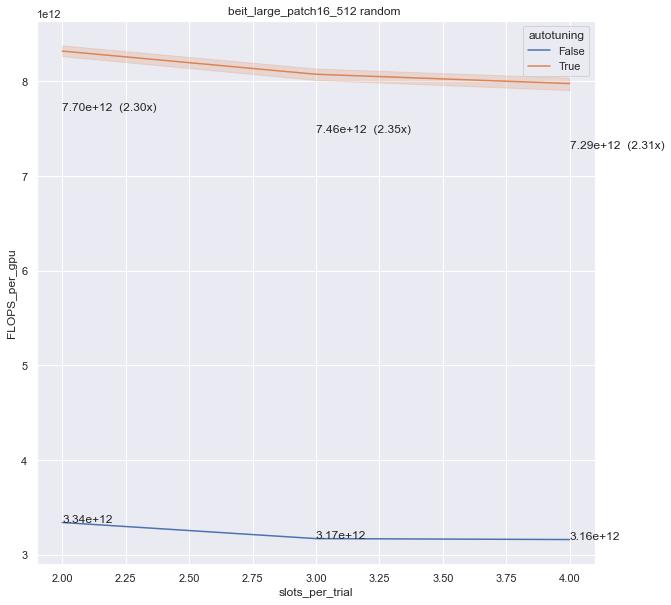

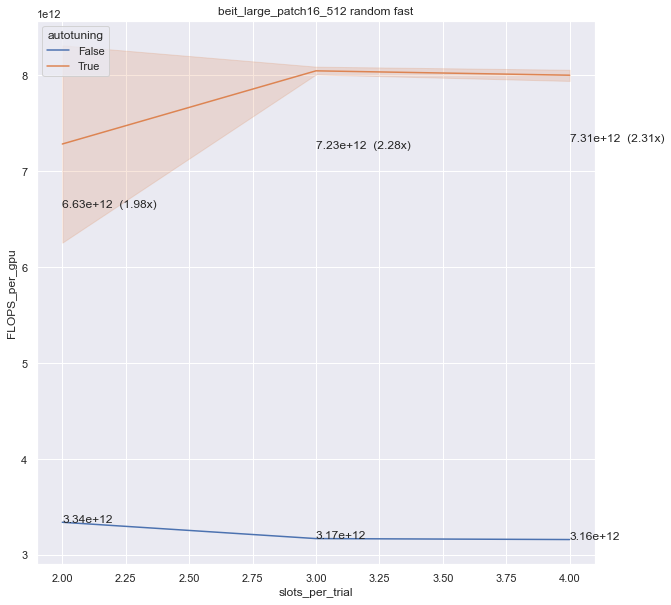

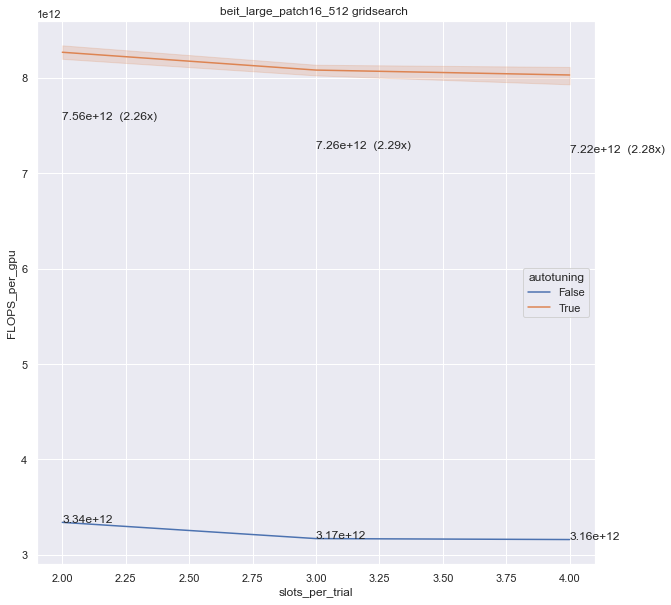

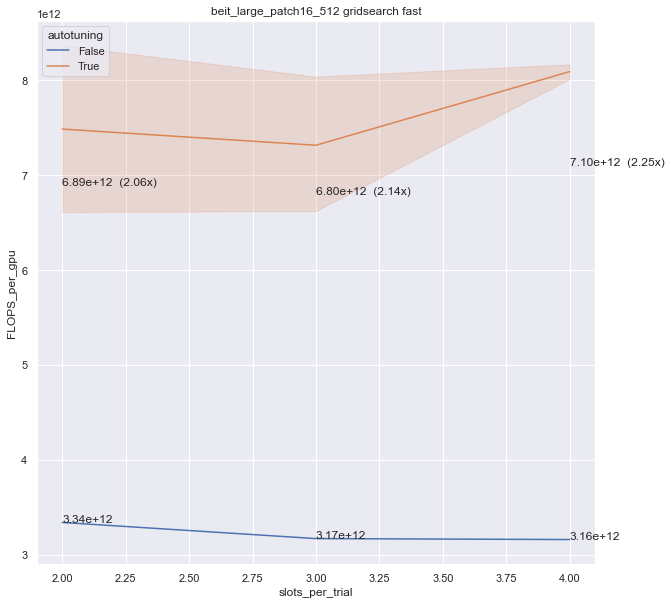

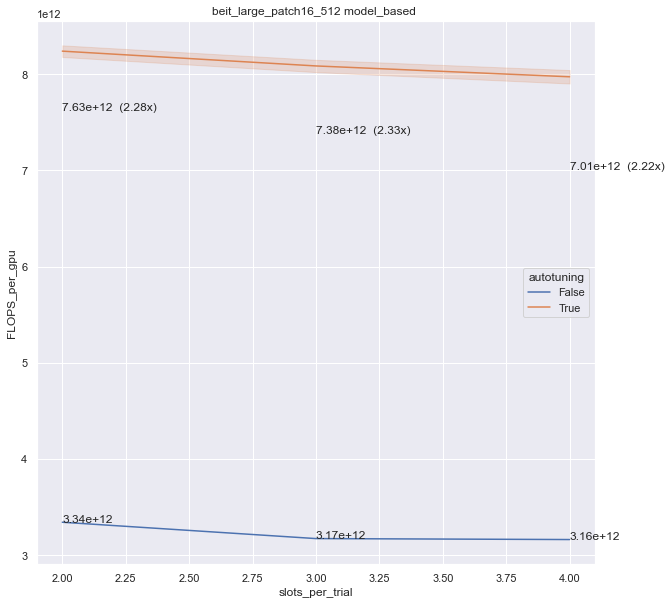

...

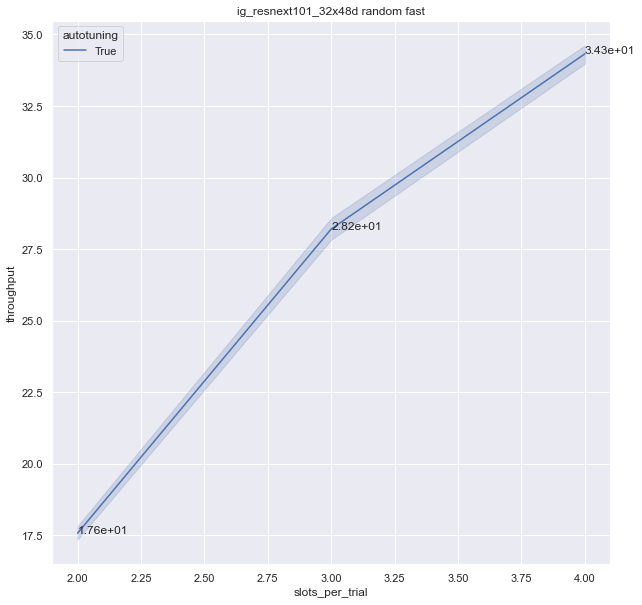

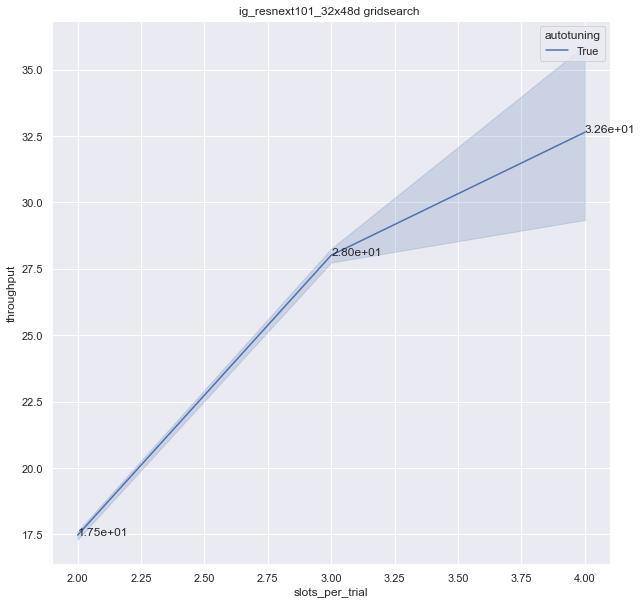

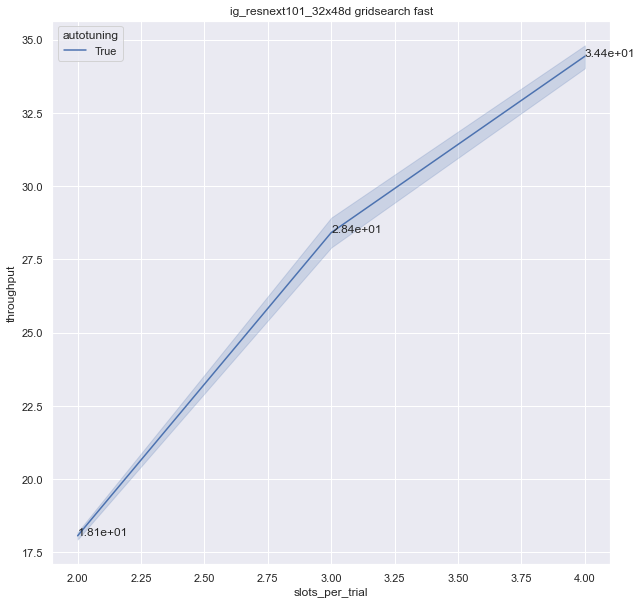

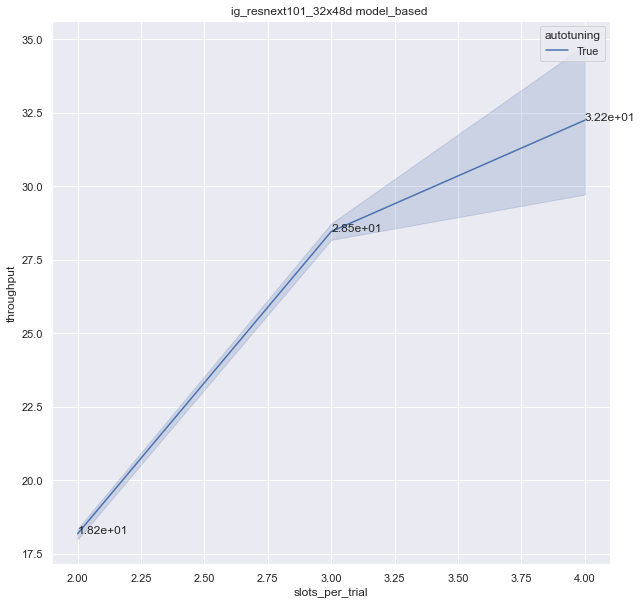

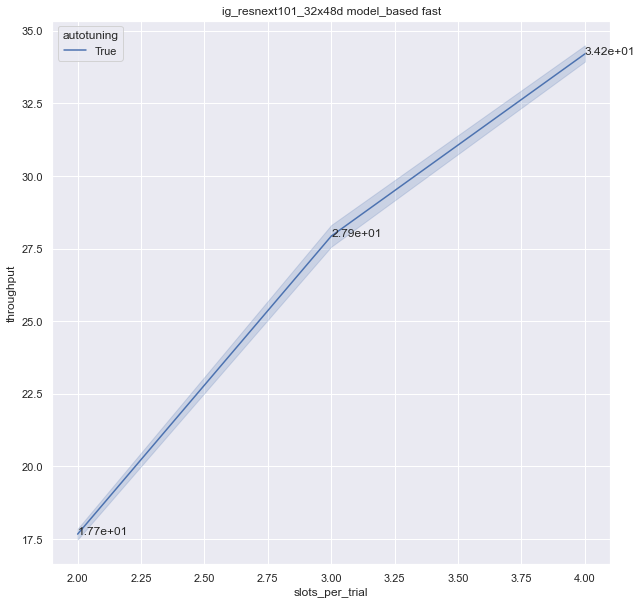

In [14]:
def no_nans(x):
    for item in x:
        if item != item:
            return False
    return True

def non_nans_iter(x):
    for item in x:
        if item != item:
            continue
        yield item
        
def non_nans_product(*args):
    prod = itertools.product(*(non_nans_iter(x) for x in args))
    return prod

for combo in non_nans_product(all_results_df.autotuning_metric.unique(),
                               all_results_df.model_name.unique(),
                               all_results_df.autotuning_tuner_type.unique(),
                               all_results_df.autotuning_fast.unique()):
    create_and_save_plot(all_results_df, *combo)
    

Tables:

Isolate all trials which have a baseline to compare to, then compute the relative improvement:

In [15]:
baseline_model_names = flops_profiler_results_df.model_name.unique()

In [16]:
results_with_baseline_df = autotuning_results_df[autotuning_results_df.model_name.isin(baseline_model_names)].copy()

In [17]:
def get_baseline_and_ratio(df, baseline_df):
    baseline = []
    ratio = []
    for _, val in df.iterrows():
        model_mask = baseline_df.model_name == val.model_name
        slot_mask = baseline_df.slots_per_trial == val.slots_per_trial
        masked_baseline_df = baseline_df[model_mask & slot_mask]
        baseline_metric = masked_baseline_df[val.autotuning_metric].values
        val_metric = val[val.autotuning_metric]
        baseline.append(baseline_metric)
        ratio.append(val_metric / baseline_metric)
    baseline = np.concatenate(baseline)
    ratio = np.concatenate(ratio)
    return baseline, ratio

In [18]:
results_with_baseline_df['baseline'], results_with_baseline_df['ratio'] = get_baseline_and_ratio(results_with_baseline_df, flops_profiler_results_df)

Create a multi-index dataframe summarizing results.

In [19]:
multi_index_categories = (results_with_baseline_df.model_name,
                          results_with_baseline_df.autotuning_metric,
                          results_with_baseline_df.autotuning_tuner_type,
                          results_with_baseline_df.autotuning_fast,
                          results_with_baseline_df.slots_per_trial)
multi_index_vals = [list(non_nans_iter(item.unique())) for item in multi_index_categories]
multi_index_counts = [len(x) for x in multi_index_vals]

In [20]:
def get_baseline_mask(name, metric, tuner_type, fast, slots):
    mask = results_with_baseline_df.model_name == name
    mask = mask & (results_with_baseline_df.autotuning_metric == metric)
    mask = mask & (results_with_baseline_df.autotuning_tuner_type == tuner_type)
    mask = mask & (results_with_baseline_df.autotuning_fast == fast)
    mask = mask & (results_with_baseline_df.slots_per_trial == slots)
    return mask

In [21]:
ratios = np.zeros(multi_index_counts)
for (name_idx, name), (metric_idx, metric), (tuner_type_idx, tuner_type), (fast_idx, fast), (slots_idx, slots) in itertools.product(*(enumerate(x) for x in multi_index_vals)):
    mask = get_baseline_mask(name, metric, tuner_type, fast, slots)
    masked_df = results_with_baseline_df[mask]
    mean_ratio = masked_df.ratio.mean()
    ratios[name_idx, metric_idx, tuner_type_idx, fast_idx, slots_idx] = mean_ratio

The multi-indexed summary of ratios:

In [22]:
ratio_summary = pd.Series(ratios.flatten(), index = pd.MultiIndex.from_product(multi_index_vals))

beit_large_patch16_512  FLOPS_per_gpu  random       False  2    2.490590
                                                           3    2.546905
                                                           4    2.523955
                                                    True   2    2.180511
                                                           3    2.538046
                                                           4    2.531641
                                       gridsearch   False  2    2.474872
                                                           3    2.548701
                                                           4    2.540473
                                                    True   2    2.240950
                                                           3    2.307338
                                                           4    2.560032
                                       model_based  False  2    2.467464
                                                   

Slice in various ways with `groupby`:

Global:

In [25]:
ratio_summary.groupby(level=1).mean()

FLOPS_per_gpu    1.628147
latency          1.060911
throughput       1.663369
dtype: float64

One more level of detail:

In [24]:
for a in range(5):
    if a != 1:
        print(ratio_summary.groupby(level=(1, a)).mean(), 80 * '-', sep='\n')

FLOPS_per_gpu  beit_large_patch16_512    2.448826
               efficientnet_b0           1.421646
               resnet152                 1.013970
latency        beit_large_patch16_512    1.067912
               efficientnet_b0           1.024686
               resnet152                 1.090135
throughput     beit_large_patch16_512    2.489719
               efficientnet_b0           1.479497
               resnet152                 1.020890
dtype: float64
--------------------------------------------------------------------------------
FLOPS_per_gpu  gridsearch     1.607662
               model_based    1.622163
               random         1.654617
latency        gridsearch     1.062146
               model_based    1.060433
               random         1.060155
throughput     gridsearch     1.652366
               model_based    1.638851
               random         1.698889
dtype: float64
--------------------------------------------------------------------------------
FLOPS_p

Fast mode isn't much faster:

In [30]:
results_with_baseline_df[results_with_baseline_df.autotuning_fast].wall_clock_time.mean()

859.5790279813278

In [31]:
results_with_baseline_df[~results_with_baseline_df.autotuning_fast].wall_clock_time.mean()

887.0996187408164